<h1>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h1>
<h2>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h2>
<h3>Γεωργούτσος Αθανάσιος: 03117151<h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

## Requirements

In [3]:
!pip install --user networkx

You should consider upgrading via the 'c:\python39\python.exe -m pip install --upgrade pip' command.


In [4]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering
from itertools import takewhile
from sklearn.cluster import SpectralClustering
from tqdm import tqdm
import time
import csv

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr> 
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr> 
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4> 
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

## Synthetic topologies

Networks must be connected graphs!!

In [5]:
# function for visualization of Random Geometric Graph

def rgg_vis(RGG):
    # visualization: following https://networkx.org/documentation/stable/auto_examples/drawing/plot_random_geometric_graph.html

    # position is stored as node attribute data for random_geometric_graph
    pos = nx.get_node_attributes(RGG, "pos")

    # find node near center (0.5,0.5)
    dmin = 1
    ncenter = 0
    for n in pos:
        x, y = pos[n]
        d = (x - 0.5) ** 2 + (y - 0.5) ** 2
        if d < dmin:
            ncenter = n
            dmin = d

    # color by path length from node near center
    p = dict(nx.single_source_shortest_path_length(RGG, ncenter))

    plt.figure(figsize=(10, 10))
    nx.draw_networkx_edges(RGG, pos, alpha=0.4)
    nx.draw_networkx_nodes(
        RGG,
        pos,
        nodelist=list(p.keys()),
        node_size=80,
        node_color=list(p.values()),
        cmap=plt.cm.Reds_r,
    )

    plt.xlim(-0.05, 1.05)
    plt.ylim(-0.05, 1.05)
    plt.axis("off")
    plt.show()

In [6]:
# parameters for the synthetic topologies below
n=80
d=4
M=300
R=0.25
p=0.3
k=4
seedno=5
random.seed(seedno)


## Regular

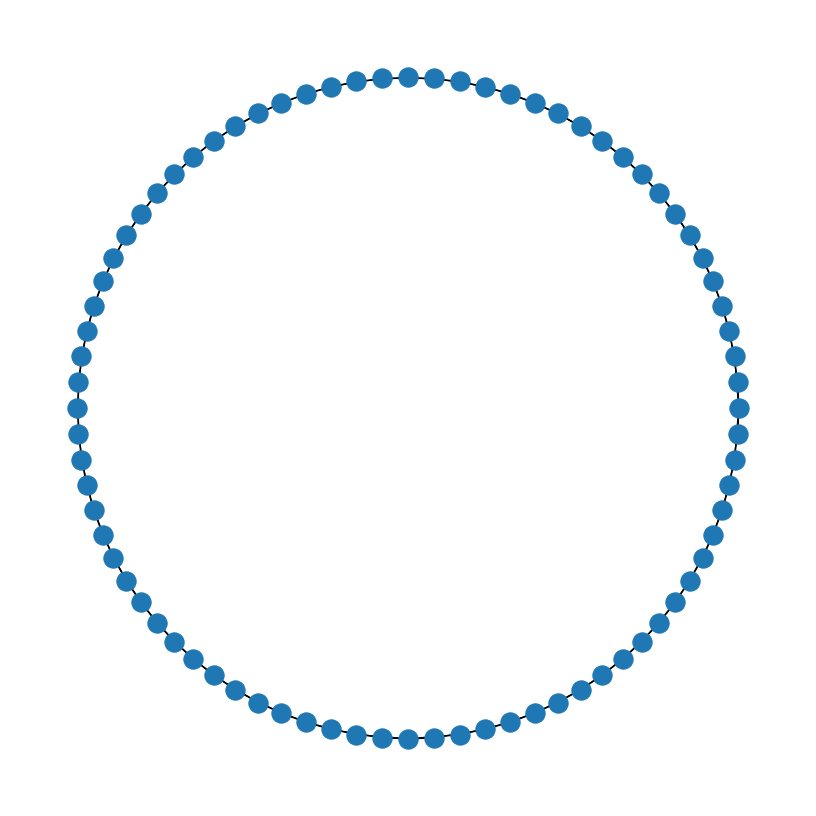

In [7]:
# regular
REG = nx.watts_strogatz_graph(n, d, 0, seedno)
if(nx.is_connected(REG)==False):
    print("Not connected graph!!")
else:    
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw_circular(REG)

## Erdos-Renyi 

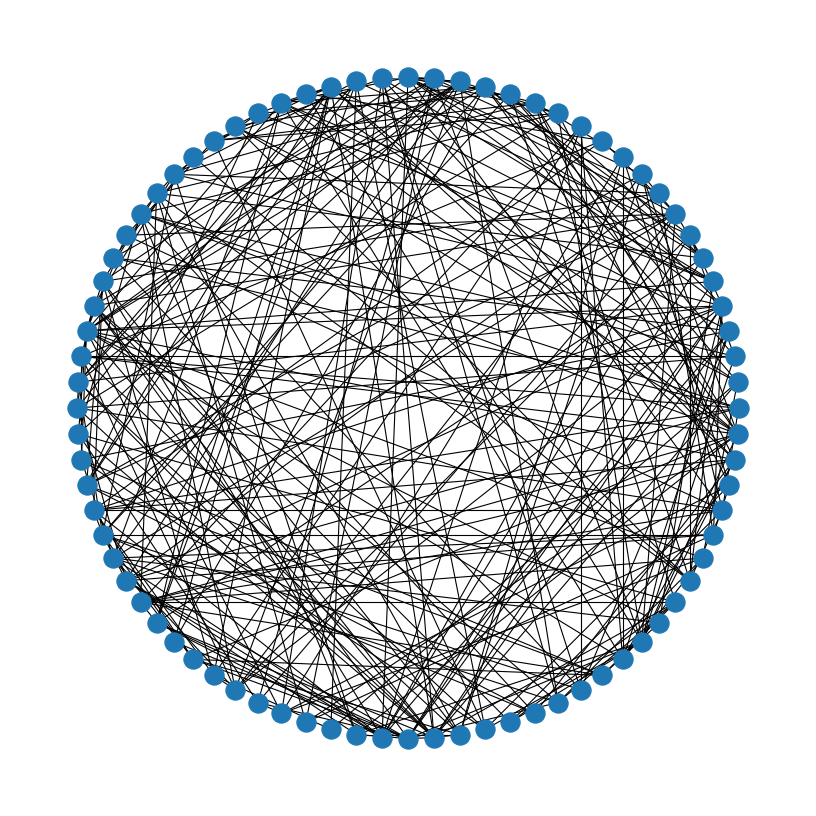

In [8]:
# Erdos-Renyi
RGER = nx.gnm_random_graph(n, M, seedno)
if(nx.is_connected(RGER)==False):
    print("Not connected graph!!")
else:    
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw_circular(RGER)

## Random Geometric

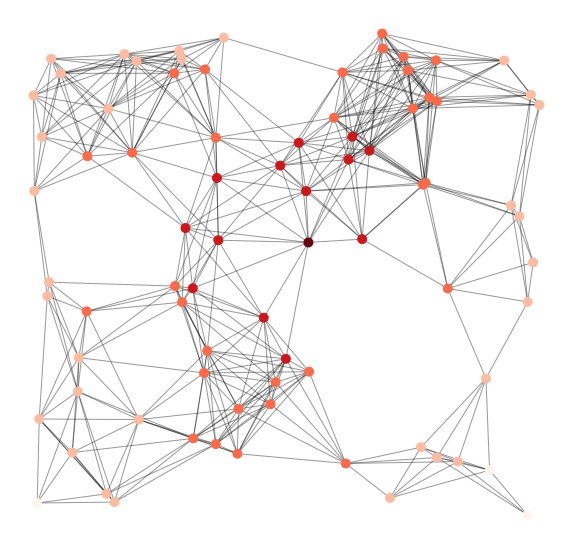

In [9]:
# Random Geometric
RGG = nx.random_geometric_graph(n, R, seed = seedno)
if(nx.is_connected(RGG)==False):
    print("Not connected graph!!")
else:
    rgg_vis(RGG)

## Gilbert

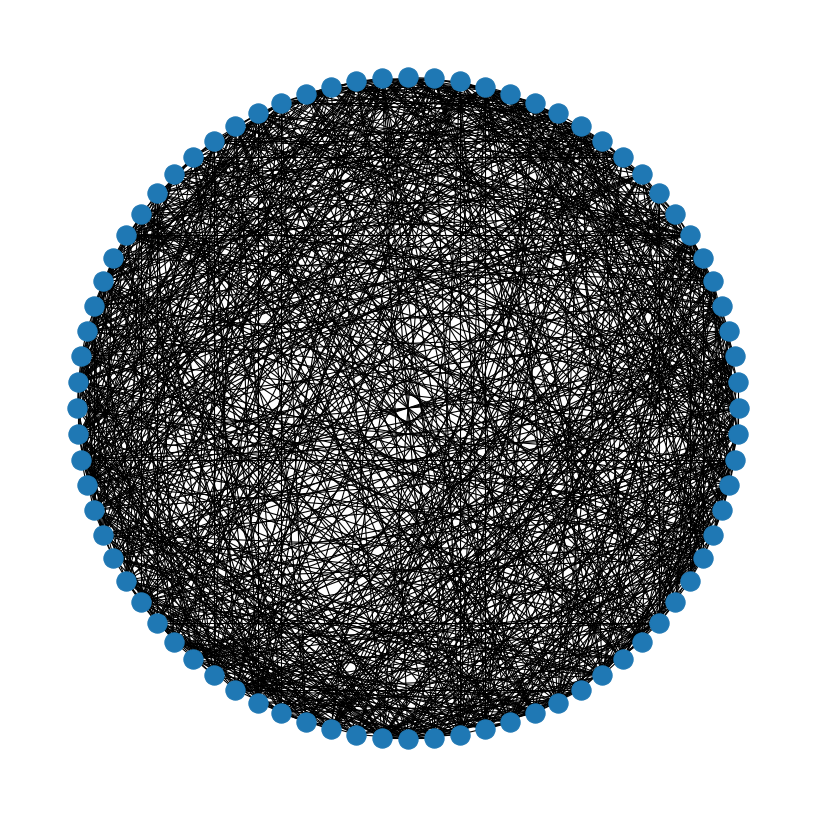

In [10]:
# Gilbert
RGG2 = nx.gnp_random_graph(n, p, seedno)
if(nx.is_connected(RGG2)==False):
    print("Not connected graph!!")
else:
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw_circular(RGG2)

## Scale-Free

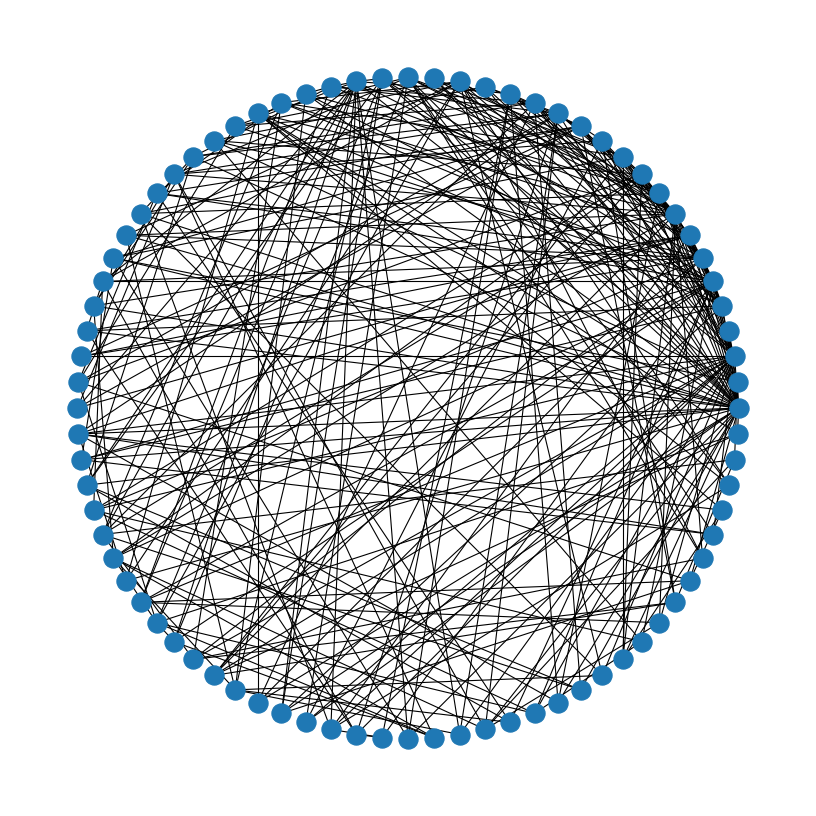

In [11]:
# scale-free
SF = nx.barabasi_albert_graph(n, d, seedno)
if(nx.is_connected(SF)==False):
    print("not connected graph!!")
else:
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw_circular(SF)

## Small-World

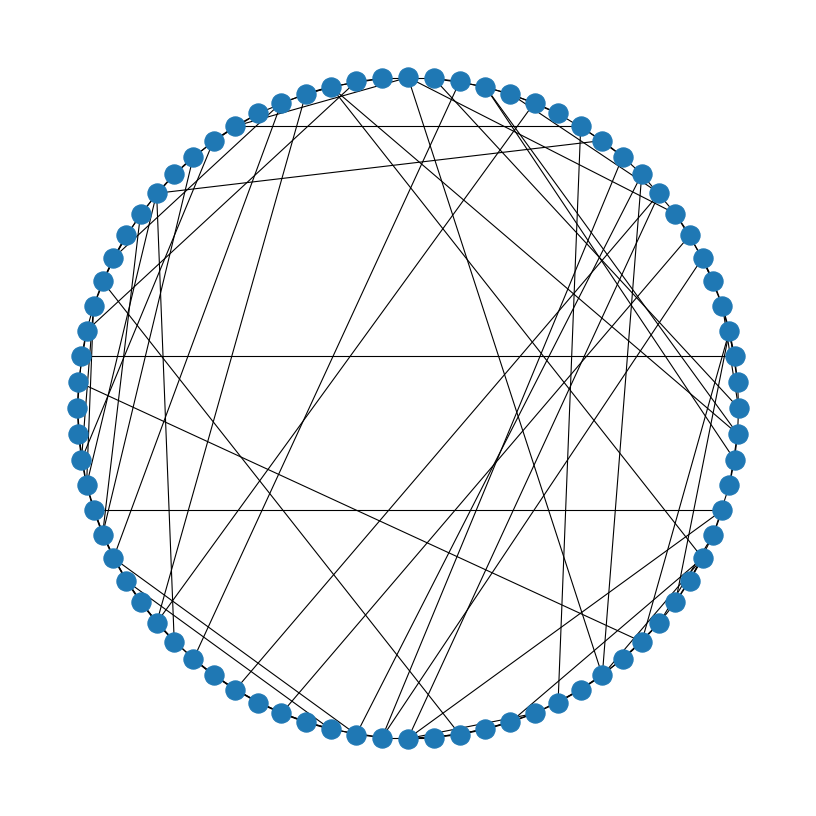

In [12]:
# small-world
SW = nx.watts_strogatz_graph(n, d, p, seedno)
if(nx.is_connected(SW)==False):
    print("Not connected graph!!")
else:    
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw_circular(SW)

<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

## Real network topologies

### College football games

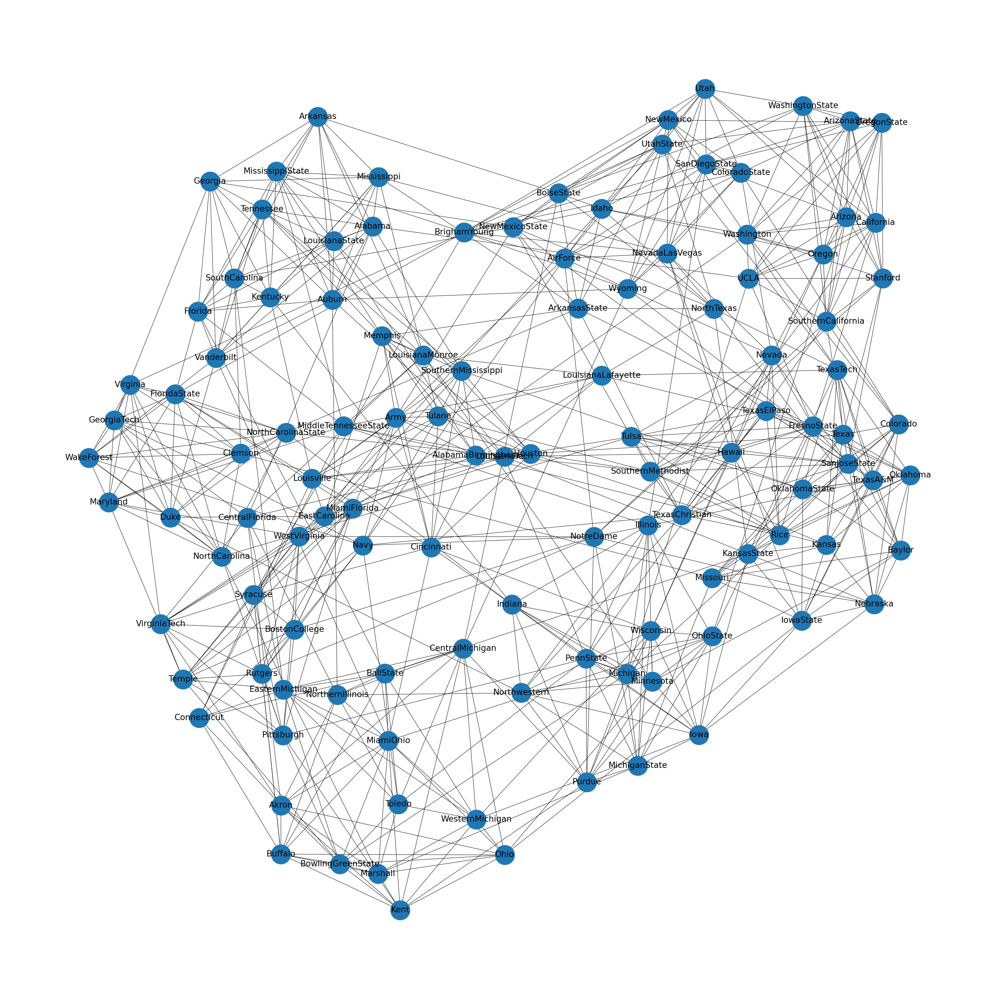

In [13]:
#football network
football=nx.read_gml(r"football.gml")

# plotting the network
plt.figure(num=None, figsize=(40, 40), dpi=80)          
nx.draw(football, with_labels=True, font_size=24, node_size=3200) 

### Game of Thrones Season 5

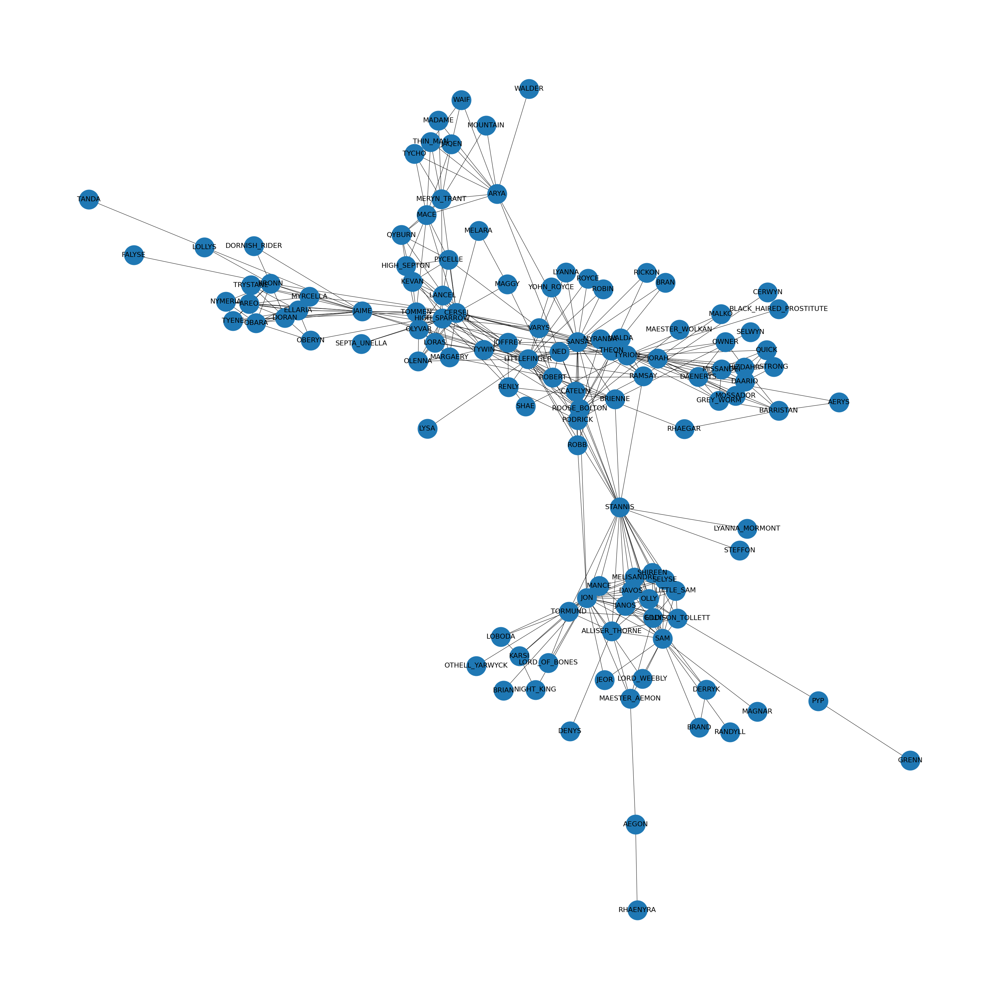

In [14]:
#Game of thrones network
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1
        
# plotting the network
plt.figure(num=None, figsize=(40, 40), dpi=80)          
nx.draw_spring(got, with_labels=True, font_size=20, node_size=3200)         

### Eu-core mail network

Studying the largest connected component of the network, after removing the self-loops.

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [ ]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())

# sort connected components from largest to smallest based on length
max_nodes = max(nx.connected_components(eu), key=len)

print("Size of largest connected domponent is: "+str(len(max_nodes))+" nodes")

# list of tuples (nodeA, nodeA) for every node
# to remove self-loops later
loops = []
for i in list(max_nodes):
    loops.append((i,i))

# create the subgraph of largest connected component
subg = eu.subgraph(list(max_nodes))

# unfreeze subg
max_eu = nx.Graph(subg)

# remove self-loops
max_eu.remove_edges_from(loops)

# plotting the network
plt.figure(num=None, figsize=(80, 80), dpi=80)          
nx.draw(max_eu, node_size=1200)    

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

## Degree analysis

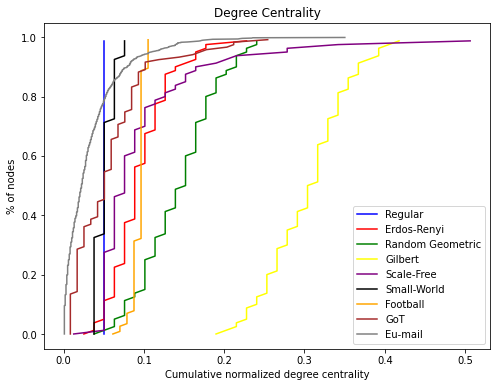

In [16]:
# list of all the above graphs
glist = [REG, RGER, RGG, RGG2, SF, SW, football, got, max_eu]
gnames = ["Regular", 'Erdos-Renyi', "Random Geometric", "Gilbert", "Scale-Free", "Small-World", "Football", "GoT", "Eu-mail"]

# function that returns list of degree centrality values for the nodes of given graph
def find_degree(G):
    
    deg = nx.degree_centrality(G).values()
    
    return list(deg)

degrees = []
colors = ['blue', 'red', 'green', 'yellow', 'purple', 'black', 'orange', 'brown', 'gray']
    
# plotting histograms for the degree centralities of the nodes of every graph

for i in range(len(glist)):
    
    l = find_degree(glist[i])
    degrees.append(l)

    # uncomment for plotting
    """
    plt.figure(figsize=(8, 6))
    plt.title(gnames[i])
    plt.ylabel("Nodes")
    plt.xlabel("Normalized degree centrality")

    n, bins, patches = plt.hist(np.sort(l), bins=20, density = False, edgecolor='white')
    
    if(np.std(l)!=0 and i>0):
        y = ((1 / (np.sqrt(2 * np.pi) * np.std(l))) * np.exp(-0.5 * (1 / np.std(l) * (bins - np.mean(l)))**2))
        plt.plot(bins, y, 'r--')
    """      

# plotting the cumulative distribution for the above in one graph for direct comparison
plt.figure(figsize=(8, 6))
plt.title('Degree Centrality')
plt.ylabel("% of nodes")
plt.xlabel("Cumulative normalized degree centrality")
for i in range(len(glist)):
        
    plt.plot(np.sort(degrees[i]), np.array(range(len(degrees[i])))/len(degrees[i]), color=colors[i], label=gnames[i])

plt.legend()    

In [15]:
# mean and variance of node degrees
for i in range(len(glist)):

    degrees = find_degree(glist[i])
    print('Mean node degree for '+gnames[i]+' is: ', round(np.mean(degrees), 6))
    print('Variance of node degree for '+gnames[i]+' is: ', round(np.var(degrees), 6))
    print()

Mean node degree for Regular is:  0.050633
Variance of node degree for Regular is:  0.0

Mean node degree for Erdos-Renyi is:  0.094937
Variance of node degree for Erdos-Renyi is:  0.001306

Mean node degree for Random Geometric is:  0.142405
Variance of node degree for Random Geometric is:  0.002189

Mean node degree for Gilbert is:  0.303165
Variance of node degree for Gilbert is:  0.002483

Mean node degree for Scale-Free is:  0.096203
Variance of node degree for Scale-Free is:  0.00535

Mean node degree for Small-World is:  0.050633
Variance of node degree for Small-World is:  0.000128

Mean node degree for Football is:  0.093516
Variance of node degree for Football is:  6e-05

Mean node degree for GoT is:  0.056402
Variance of node degree for GoT is:  0.00223

Mean node degree for Eu-mail is:  0.03308
Variance of node degree for Eu-mail is:  0.001413



### Observations

The degree analysis for the synthetic networks has been done in the previous lab exercise, so its results will be considered known. I am going to compare the real networks to the synthetics and try to find similarities. First, I find the synthetic networks with the most similar node degree distribution and, then, I study the mean and variance of the node degrees.

**Football**: Comparing the node degree distributions, the football network is closer to **the small-world and the Erdos-Renyi**. Then, its average node degree is almost equal to the one for Erdos-Renyi, while its node degree variance is extremely low, hence closer to the small-world variance than the one for Erdos-Renyi.

**GoT**: This network has a similar node distribution to the **scale-free**, even though its average node degree is the half of the one for scale-free. Considering node degrees 0.2 and above, there are also similarities with **Erdos-Renyi and Random Geometric**. In terms of average node degree, there is a deviation based on the different parameters of the synthetic networks. In terms of variance, the GoT variance is almost equal to the one of the Random Geomteric graph.

**Eu-mail**: Its node degree distribution is similar to the one for **scale-free network**. The average node degree and variance cannot be compared easily with the ones for the other networks, because of the considerably larger number of nodes and connections.

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

## Clustering coefficient analysis

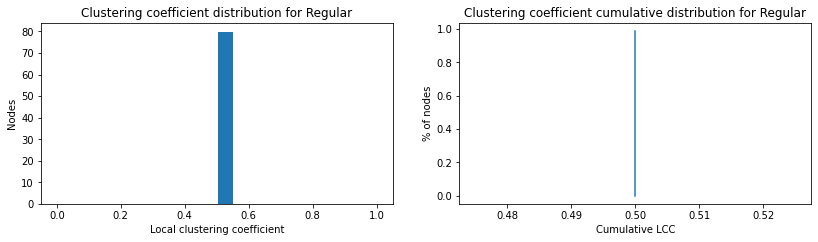

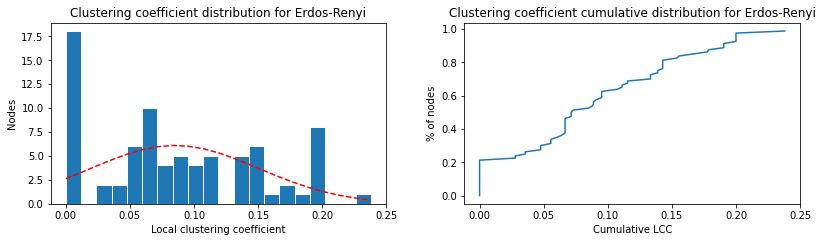

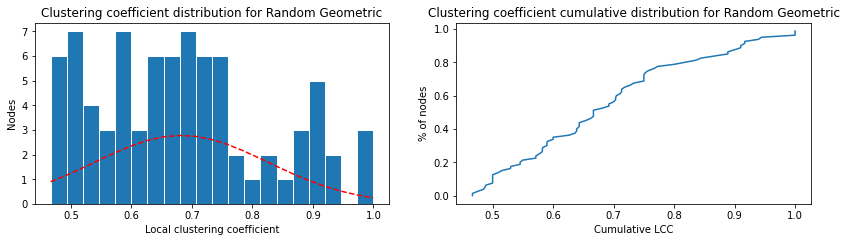

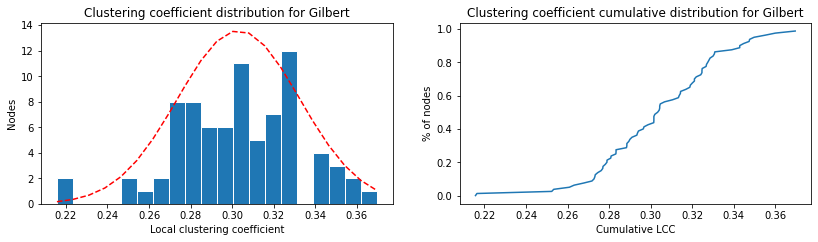

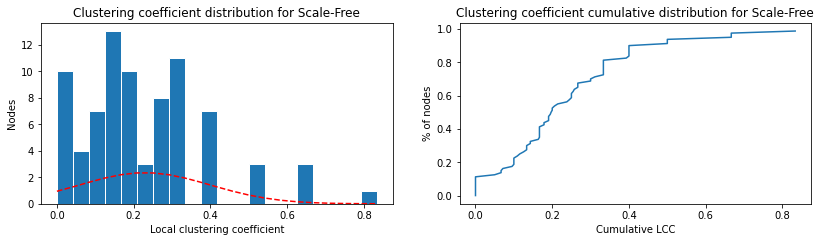

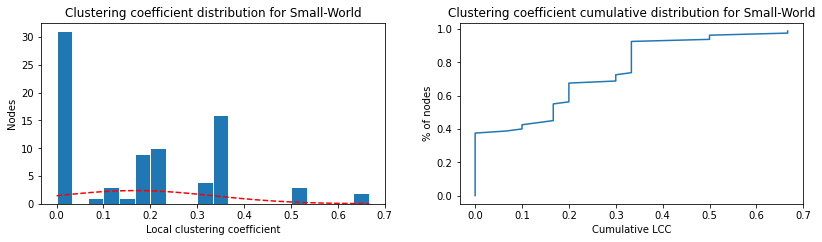

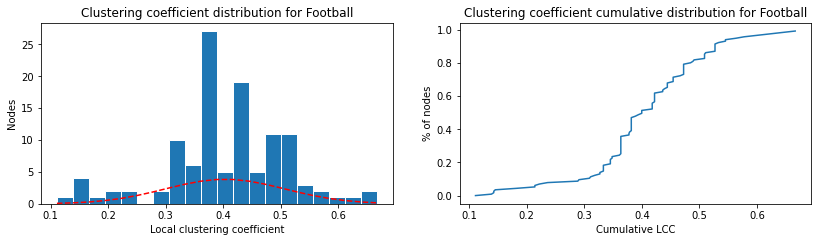

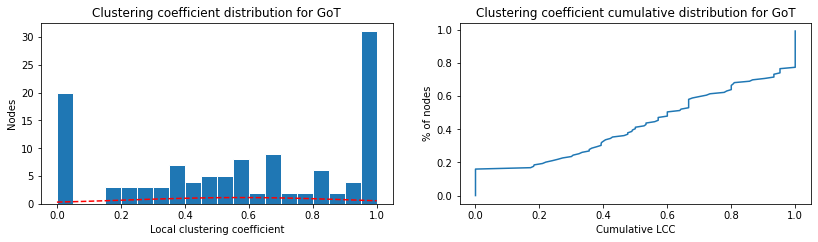

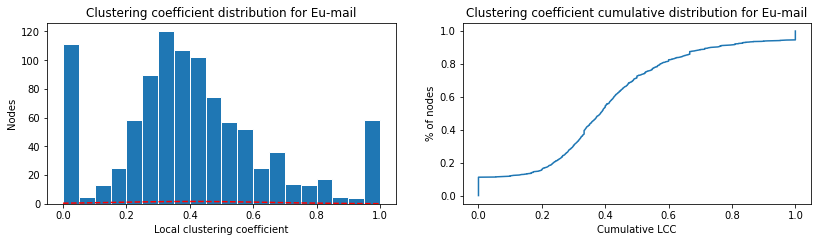

In [16]:
# function calculating clustering coefficient for every node of given graph
def cc( G ):
    return nx.clustering(G)

# function plotting graph G's clustering coefficients' distribution  
def plot_cc(cc, name):
    
    # list of clustering coefficients
    l = list(cc.values())

    # create subplots
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(12, 4)
    ax1.set_title("Clustering coefficient distribution for "+name)
    ax1.set_ylabel("Nodes")
    ax1.set_xlabel("Local clustering coefficient")
    # y-axis : nodes, x-axis : clustering coefficient
    n, bins, patches = ax1.hist(np.sort(l), bins=20, density = False, edgecolor='white')
    
    if(np.std(l)!=0):
        y = ((1 / (np.sqrt(2 * np.pi) * np.std(l))) * np.exp(-0.5 * (1 / np.std(l) * (bins - np.mean(l)))**2))
        ax1.plot(bins, y, 'r--')
    
    # cumulative distribution
    ax2.set_title("Clustering coefficient cumulative distribution for "+name)
    ax2.set_ylabel("% of nodes")
    ax2.set_xlabel("Cumulative LCC")
    # canonicalized y-axis to scale 0.0-1.0
    ax2.plot(np.sort(l), np.array(range(len(l)))/float(len(l)))
    fig.tight_layout(pad=3.0)

# using above functions for our graphs
for i in range(len(glist)):
    
    clust_coeff = cc (glist[i])
    plot_cc( clust_coeff, gnames[i])

In [17]:
# calculating mean clustering coefficient for our graphs
for i in range(len(glist)):
    print('Mean clustering coefficient for '+gnames[i]+' is: '+str(nx.average_clustering(glist[i])))

print()

# calculating variance of clustering coefficient for our graphs
for i in range(len(glist)):
    
    difsum = 0
    avg = nx.average_clustering(glist[i])
    l = list(cc(glist[i]).values())
    
    for j in l:
            difsum += (j-avg)**2
            
    print('Variance of clustering coefficient for '+gnames[i]+' is: '+str(difsum/len(l)))      

Mean clustering coefficient for Regular is: 0.5
Mean clustering coefficient for Erdos-Renyi is: 0.08497775916893564
Mean clustering coefficient for Random Geometric is: 0.6825788363897884
Mean clustering coefficient for Gilbert is: 0.3031095412714133
Mean clustering coefficient for Scale-Free is: 0.22922761606585143
Mean clustering coefficient for Small-World is: 0.16708333333333333
Mean clustering coefficient for Football is: 0.40321601104209814
Mean clustering coefficient for GoT is: 0.5744036387164706
Mean clustering coefficient for Eu-mail is: 0.40705044751953817

Variance of clustering coefficient for Regular is: 0.0
Variance of clustering coefficient for Erdos-Renyi is: 0.004288874899085844
Variance of clustering coefficient for Random Geometric is: 0.020650408506201083
Variance of clustering coefficient for Gilbert is: 0.0008648284118422941
Variance of clustering coefficient for Scale-Free is: 0.02892890777065042
Variance of clustering coefficient for Small-World is: 0.028069270

### Observations

Clustering coefficient is a measure quantifying the grouping of a network, the degree to which the nodes tend to cluster together. 

**Football**: It's hard to compare the above values with the ones for the synthetic networks, because they have different number of nodes. The above CC distributions show me that Football network could be closer to **the Small-World**. Below, I create a SW network with number of nodes and connections similar to football network. It is clear that the results are a lot closer to the ones for football above. This enhances my previous observations about football being a Small-World network. 

**GoT**: The conclusion from the above CC distributions is that GoT is similar to Random Geometric graph, but with many nodes having CC equal to 0 (characteristic of Scale-Free) or 1. Below, I create a RGG and a SF with number of nodes and connections closer to GoT. The **Random Geometric Graph** results are close to GoT, simulating the CC distribution of GoT accurately.

**Eu-mail**: The results of Eu-mail are closer to the ones of RGG and SF, like GoT. I construct these synthetic networks with Eu-mail's characteristics below and observe the result. The average and variance of CC differ from the ones of the Eu-mail, but this is due to the pattern the synthetic networks are constructed. Observing the distributions, I can say that Eu-mail is significantly closer to **Scale-Free**, but the values of Eu-mail are considerably higher.

The high number of nodes with clustering coefficient equal to 0 or 1 for GoT and Eu-mail is a characteristic that is not found in the synthetic networks. I guess that this is caused in real networks of their kind, because of characteristics of human behavior.


#### SW closer to Football

Mean clustering coefficient for SW2 is: 0.355882957622088
Variance of clustering coefficient for SW2 is: 0.01396072872647514


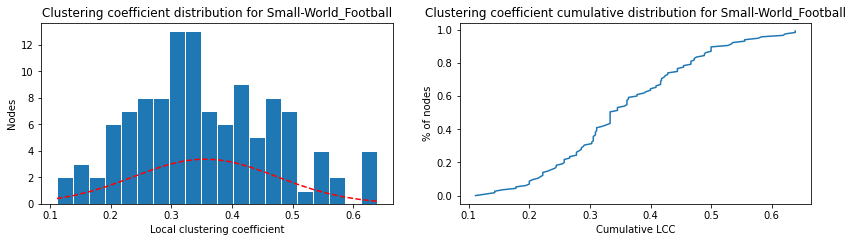

In [38]:
# small-world
SW2 = nx.watts_strogatz_graph(115, 10, 0.2, seedno)

clust_coeff = cc (SW2)
plot_cc( clust_coeff, 'Small-World_Football')

print('Mean clustering coefficient for SW2 is: '+str(nx.average_clustering(SW2)))

difsum = 0
avg = nx.average_clustering(SW2)
l = list(cc(SW2).values())
    
for j in l:
    difsum += (j-avg)**2
            
print('Variance of clustering coefficient for SW2 is: '+str(difsum/len(l)))      

#### RGG and SF closer to GoT

Mean clustering coefficient for RGG is: 0.5918824839877468
Variance of clustering coefficient for RGG is: 0.04813228441525329
Mean clustering coefficient for SF is: 0.19809721203067385
Variance of clustering coefficient for SF is: 0.029908289964464672


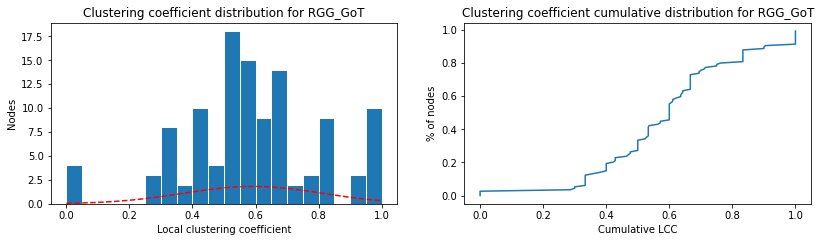

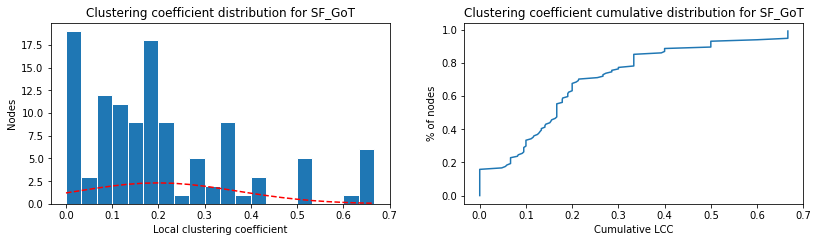

In [44]:
RGG2 = nx.random_geometric_graph(114, 0.14, seed = seedno)

SF2 = nx.barabasi_albert_graph(114, 4, seedno)

got_graphs = [RGG2, SF2]
got_graph_names = ['RGG', 'SF']

for i in range(2):
    clust_coeff = cc (got_graphs[i])
    plot_cc( clust_coeff, got_graph_names[i]+'_GoT')

    print('Mean clustering coefficient for '+got_graph_names[i]+' is: '+str(nx.average_clustering(got_graphs[i])))

    difsum = 0
    avg = nx.average_clustering(got_graphs[i])
    l = list(cc(got_graphs[i]).values())

    for j in l:
        difsum += (j-avg)**2

    print('Variance of clustering coefficient for '+got_graph_names[i]+' is: '+str(difsum/len(l)))

#### RGG and SF closer to Eu-mail

Mean clustering coefficient for RGG is: 0.7700862523609634
Variance of clustering coefficient for RGG is: 0.00925130931873617
Mean clustering coefficient for SF is: 0.1310611017754639
Variance of clustering coefficient for SF is: 0.0006447941481340743


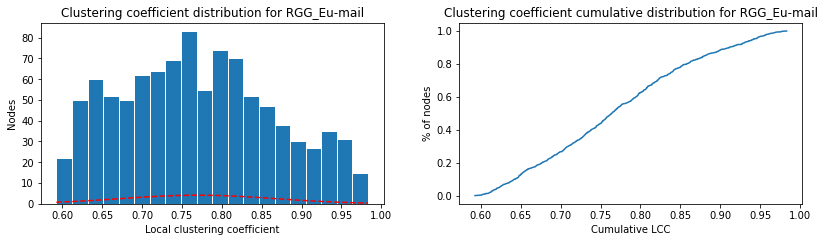

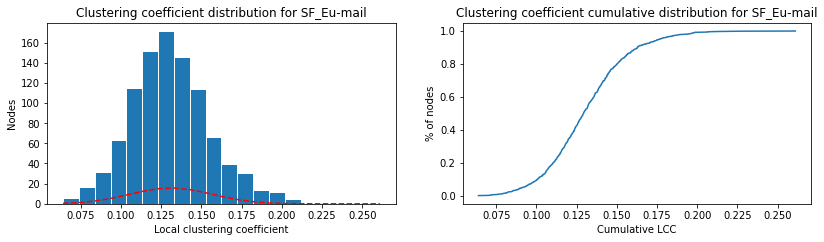

In [45]:
RGG3 = nx.random_geometric_graph(986, 0.5, seed = seedno)

SF3 = nx.barabasi_albert_graph(986, 33, seedno)

eu_graphs = [RGG3, SF3]
eu_graph_names = ['RGG', 'SF']

for i in range(2):
    clust_coeff = cc (eu_graphs[i])
    plot_cc( clust_coeff, eu_graph_names[i]+'_Eu-mail')

    print('Mean clustering coefficient for '+eu_graph_names[i]+' is: '+str(nx.average_clustering(eu_graphs[i])))

    difsum = 0
    avg = nx.average_clustering(eu_graphs[i])
    l = list(cc(eu_graphs[i]).values())

    for j in l:
        difsum += (j-avg)**2

    print('Variance of clustering coefficient for '+eu_graph_names[i]+' is: '+str(difsum/len(l)))

<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

## Closeness centrality analysis

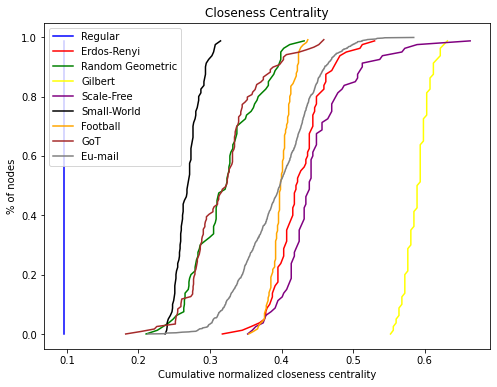

In [17]:
# function that returns list of closeness centrality values for nodes of given graph
def find_closeness(G):
    cls = nx.closeness_centrality(G).values()
    
    return list(cls)

close = []
    
# plotting histograms for the closeness centralities of the nodes of every graph
for i in range(len(glist)):
    
    l = find_closeness(glist[i])
    close.append(l)

    # uncomment for plotting
    """
    plt.figure(figsize=(8, 6))
    plt.title(gnames[i])
    plt.ylabel("Nodes")
    plt.xlabel("Normalized closeness centrality")

    n, bins, patches = plt.hist(np.sort(l), bins=20, density = False, edgecolor='white')
    
    if(np.std(l)!=0 and i>0):
        y = ((1 / (np.sqrt(2 * np.pi) * np.std(l))) * np.exp(-0.5 * (1 / np.std(l) * (bins - np.mean(l)))**2))
        plt.plot(bins, y, 'r--')
    """    

# plotting the cumulative distribution for the above in one graph for direct comparison
plt.figure(figsize=(8, 6))
plt.title('Closeness Centrality')
plt.ylabel("% of nodes")
plt.xlabel("Cumulative normalized closeness centrality")
for i in range(len(glist)):
        
    plt.plot(np.sort(close[i]), np.array(range(len(close[i])))/len(close[i]), color=colors[i], label=gnames[i])

plt.legend()

In [21]:
# mean and variance of closeness centrality
for i in range(len(glist)):

    cls = find_closeness(glist[i])
    print('Mean proximity for '+gnames[i]+' is: ', round(np.mean(cls),6))
    print('Variance of proximity for '+gnames[i]+' is: ', round(np.var(cls),6))
    print()

Mean proximity for Regular is:  0.096341
Variance of proximity for Regular is:  0.0

Mean proximity for Erdos-Renyi is:  0.42423
Variance of proximity for Erdos-Renyi is:  0.001367

Mean proximity for Random Geometric is:  0.320088
Variance of proximity for Random Geometric is:  0.002353

Mean proximity for Gilbert is:  0.589742
Variance of proximity for Gilbert is:  0.000307

Mean proximity for Scale-Free is:  0.446445
Variance of proximity for Scale-Free is:  0.002744

Mean proximity for Small-World is:  0.269143
Variance of proximity for Small-World is:  0.00032

Mean proximity for Football is:  0.399319
Variance of proximity for Football is:  0.000246

Mean proximity for GoT is:  0.319052
Variance of proximity for GoT is:  0.002653

Mean proximity for Eu-mail is:  0.394464
Variance of proximity for Eu-mail is:  0.002988



### Observations

**Football**: Its closeness centrality distribution has a small range of values (0.36 to 0.44), proving to be similar to Small-World network and Gilbert. The average closeness centrality for the new **Small-World** model below is almost equal to Football, proving to be the synthetic network closer to it.

**GoT**: The GoT distribution finds an almost perfect match in **Random Geometric** graph. Moreover, their average and variance for closeness centrality are almost the same.

**Eu-mail**: The closeness centrality distribution for Eu-mail is similar to Erdos-Renyi and Scale-Free synthetic networks. Below, I observe their average and variance, when they are built more like Eu-mail.  The results are similar to the ones of the first synthetic networks and do not provide any more connections. So, considering the variance of proximity for the graphs, I conclude that Eu-mail is closer to **Scale-Free network**.

In [48]:
cls = find_closeness(SW2)
print('Mean proximity for SW similar to Football: ', round(np.mean(cls),6))
print()

cls = find_closeness(nx.gnp_random_graph(115, 0.1, seedno))
print('Mean proximity for Gilbert similar to Football: ', round(np.mean(cls),6))
print()

cls = find_closeness(SF3)
print('Mean proximity for SF similar to Eu-mail: ', round(np.mean(cls),6))
print('Variance of proximity for SF similar to Eu-mail: ', round(np.var(cls),6))
print()    

cls = find_closeness(nx.gnm_random_graph(986, 16000, seedno))
print('Mean proximity for Erdos-Renyi similar to Eu-mail: ', round(np.mean(cls),6))
print('Variance of proximity for Erdos-Renyi similar to Eu-mail: ', round(np.var(cls),6))
print() 

Mean proximity for SW similar to Football:  0.396182

Mean proximity for Gilbert similar to Football:  0.452588

Mean proximity for SF similar to Eu-mail:  0.507811
Variance of proximity for SF similar to Eu-mail:  0.000324

Mean proximity for Erdos-Renyi similar to Eu-mail:  0.435353
Variance of proximity for Erdos-Renyi similar to Eu-mail:  0.000188



## Final Observations

Well, considering all the results of the above analysis, it is safe to continue to the next section, treating:

**1) Football network as a Small-World network**

**2) GoT network as a Random Geometric Graph network**. Even though there are similarities with scale-free network as well, the results regarding clustering coefficient and closeness centrality prove that the position of the nodes and the area around them have a significant role in the connections the nodes make with each other. Considering the nature of the network, the different places in Westeros that the characters live in, it is expected that their location is one of the main factors of how they interfere with each other.

**3) Eu-mail network as a Scale-Free network**

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

## Community detection

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

Modifying the node labels of the real networks, so that they are integers.

In [18]:
# Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικ΄ές τοπολογίες σε integers
# transforming the labels of real networks to integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

football2, football_map = conv2int(football, 0)
got2, got_map = conv2int(got, 0)
max_eu2, max_eu_map = conv2int(max_eu, 0)

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

Setting colors for community visualization.

In [19]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())

### Modularity score

How many edges exist inside the community, in contrast to the number of edges that could exist inside the community, if they had been distributed randomly, while maintaining the node degree distribution.

### Performance score

How many pairs of nodes have been interpreted correctly by the partitioning. Specifically, the number of pairs of nodes in the same community that are connected by an edge, and the number of pairs of nodes in different communities that are not connected by an edge.

## Community Detection Methods

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan με την αφαίρεση το πολύ 50 ακμών.</p> 
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

### Newman-Girvan method

A method that finds the edge with highest Edge Betweenness Centrality and removes it from the graph, in each iteration. Step by step, the graph is being deconstructed, forming communities. 

The partitions that come up require the cut of no more than 50 edges for this lab exercise.

Picking the partitions with 1) highest modularity score, 2) highest performance score, for every real and complex network of the previous part.

In [20]:
# function returning best partitions on criteria 1 or 2 above, for newman-girvan.
# G is the given graph, k the upper limit for edge cutting,
# score: the metric for best partitions, True for modularity and False for performance
def ng_method(G, k, score):
    best = 0
    final_comms = None
    
    comp = nx.algorithms.community.centrality.girvan_newman(G)
    limited = takewhile(lambda c: len(c) <= k, comp)
    
    for communities in tqdm(limited):
        com = list(sorted(c) for c in communities)
        if score==True:
            metric = nx.algorithms.community.quality.modularity(G,com)
        else:
            _ , metric = nx.algorithms.community.quality.partition_quality(G,com)
        
        if metric>best:
            best = metric
            final_comms = com
        
    return (best, final_comms)
        
    

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,|V|$. Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

### Spectral clustering method

Given the eigenvectors and eigenvalues of a given matrix of the graph, this method moves the nodes to k-dimensions (when testing for k communities), calculating its node's community based on its distance from its community's center.

Projection subspace dimension is chosen based on the number of nodes of the given network. For this lab exercise, we are checking all the partitions for 2...50 dimensions of projection subspace and pick again based on higher modularity or performance score.

In [21]:
# function returning best partitions based on modularity or performance score, for spectral clustering.
# G is the given graph, k the upper limit for projection subspace dimensions,
# score: the metric for best partitions, True for modularity and False for performance
def sc_method(G, k, score):
    best = 0
    final_comms = None
    
    A = nx.to_numpy_matrix(G)
    
    for i in tqdm(range(2,k+1)):
        com = []
        clustering = SpectralClustering(n_clusters=i, affinity='precomputed').fit(A)
        
        for j in np.unique(clustering.labels_):
            com.append([x for x in range(len(clustering.labels_)) if clustering.labels_[x]==j])
        
        if score==True:
            metric = nx.algorithms.community.quality.modularity(G,com)
        else:
            _ , metric = nx.algorithms.community.quality.partition_quality(G,com)
        
        if metric>best:
            best = metric
            final_comms = com
        
    return (best, final_comms)

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

### Modularity Maximization

A greedy method that begins by considering every node as a community. Then, in each step it combines a node with a community of one of its neighbors, forming a larger community. As long as the modularity score increases, the method proceeds with the next iteration. If not, then the method has reached a local maximum of modularity score and returns.

Calculate modularity and performance score for every partition of every synthetic and real network.

In [22]:
# greedy method to find graph's partition that maximizes modularity score
# G: the given graph, score: True for modularity, False for performance
def max_mod(G, score):
    start = time.time()
    comms = [list(x) for x in nx.algorithms.community.modularity_max.greedy_modularity_communities(G)]
    if score:
        metric = nx.algorithms.community.quality.modularity(G, comms)
    else:
        _, metric = nx.algorithms.community.quality.partition_quality(G, comms)
    finish = time.time()
        
    print("Overall time of modularity maximization process: "+str(finish-start)+" seconds")    
    return (metric, comms)

**Modularity score**: the percentage of edges inside a community in contrast to the ones that would be inside a community, if we had distributed the edges randomly, maintaining the node degree distribution.

**Performance score**: The number of nodes that have been interpreted correctly by the method of partition. This is translated to the existence of an edge among two nodes of the same community and the absense of an edge among two nodes of different communities.

## Visualizations

In [23]:
# visualization function for every method of the above based on given metric
# G: the graph, k (50 for this exercise): number of iterations,
# score: True for modularity score, False for performance,
# pos: draw layout, ns: node size, figsize: ..

def vis_comms(G, k, score, pos, ns, figsize):
    plt.figure(num=None, figsize=(figsize, figsize), dpi=80)
    ng_best, ng_comms = ng_method(G, k, score)
    if score==True:
        print("Modularity score of Girvan-Newman is: "+str(ng_best))
    else:
        print("Performance score of Girvan-Newman is: "+str(ng_best))
    print("Number of partitions: "+str(len(ng_comms)))    
    print()    
    plt.title("Newman-Girvan method")
    nx.draw_networkx_edges(G, pos=pos)
    for i in range(len(ng_comms)):
        nx.draw_networkx_nodes(G, pos=pos, nodelist=ng_comms[i], node_color=colors[i], node_size=ns)
    
    plt.figure(num=None, figsize=(figsize, figsize), dpi=80)
    sc_best, sc_comms = sc_method(G, k, score)
    if score==True:
        print("Modularity score of Spectral Clustering is: "+str(sc_best))
    else:
        print("Performance score of Spectral Clustering is: "+str(sc_best))
    print("Number of partitions: "+str(len(sc_comms)))
    print()    
    plt.title("Spectral clustering method")
    nx.draw_networkx_edges(G, pos=pos)
    for i in range(len(sc_comms)):
        nx.draw_networkx_nodes(G, pos=pos, nodelist=sc_comms[i], node_color=colors[i], node_size=ns)
    
    plt.figure(num=None, figsize=(figsize, figsize), dpi=80)
    mm_best, mm_comms = max_mod(G, score)
    if score==True:
        print("Modularity score of Modularity Maximization is: "+str(mm_best))
    else:
        print("Performance score of Modularity Maximization is: "+str(mm_best))
    print("Number of partitions: "+str(len(mm_comms)))
    print()    
    plt.title("Modularity maximization method")
    nx.draw_networkx_edges(G, pos=pos)
    for i in range(len(mm_comms)):
        nx.draw_networkx_nodes(G, pos=pos, nodelist=mm_comms[i], node_color=colors[i], node_size=ns)
        

#### Οπτικοποίηση κοινοτήτων American College Football

### American College Football

#### Based on modularity

49it [00:19,  2.55it/s]
  0%|          | 0/49 [00:00<?, ?it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


Modularity score of Girvan-Newman is: 0.5996290274077957
Number of partitions: 10



  2%|▏         | 1/49 [00:00<00:18,  2.58it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  4%|▍         | 2/49 [00:00<00:13,  3.47it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  6%|▌         | 3/49 [00:01<00:15,  2.89it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/d

Modularity score of Spectral Clustering is: 0.6022010863056824
Number of partitions: 11

Overall time of modularity maximization process: 0.1659996509552002 seconds
Modularity score of Modularity Maximization is: 0.5497406651426807
Number of partitions: 6



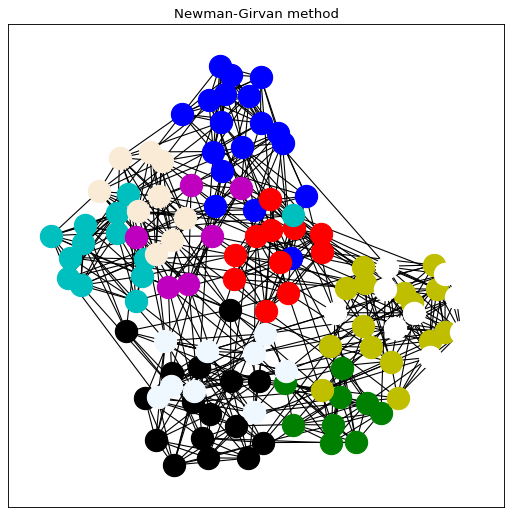

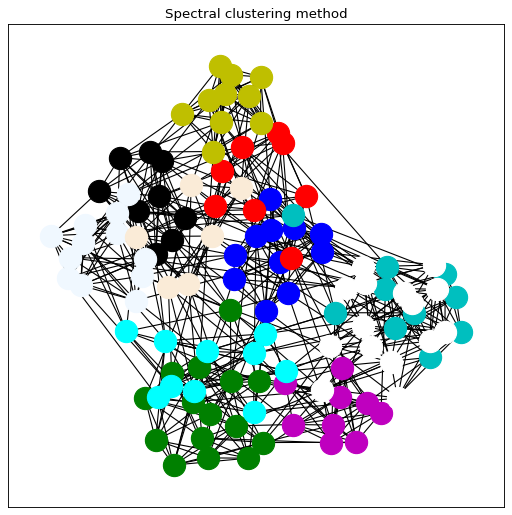

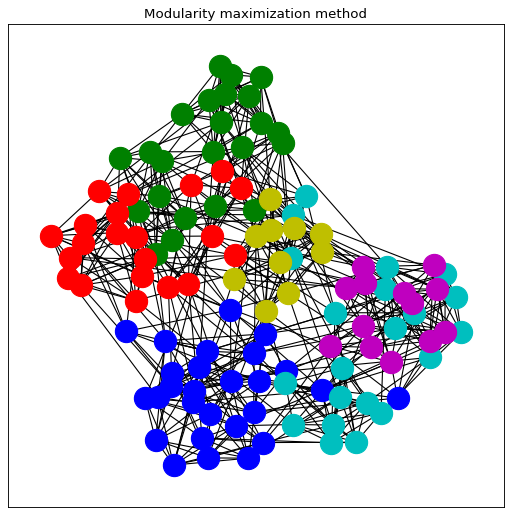

In [24]:
layout_football2 = nx.spring_layout(football2)
vis_comms(football2, 50, True, layout_football2, 400, 8)

#### Based on performance

In [ ]:
vis_comms(football2, 50, False, layout_football2, 600, 8)

#### Observations

First, I am going to compare the runitime for each method. It seems that Girvan-Newman method is the slowest (about 24 seconds), which is normal considering that there are about 600 edges and this method calculates EBC in each iteration, a very time-consuming process. Then, Spectral Clustering finishes in 14 seconds, while Modularity Maximization is significantly quicker, finishing in 0.5-1 second.

Concerning the number of communities formed, for the modularity score G-N forms 10, SC forms 11 and MM forms 6 communities. Moving to performance score, MM forms exactly the same communities, that consist from the same nodes. On the other hand, G-N and SC increase their number of communities to 17 and 16 respectively.

Then, the modularity scores for the first two methods are almost equal (0.6) with spectral clustering slightly ahead. Modularity maximization is not far behind with score 0.55. Performance score is, however, another case, since Girvan-Newman and spectral clustering score 0.958, while modularity maximization scores 0.868, considerably less.

All in all, the tradeoff of runtime and scores leads to **Spectral Clustering**, unless the need for quick results is the most important, where Modularity Maximization would also perform well.

#### Οπτικοποίηση κοινοτήτων Game of Thrones

### Game of Thrones

#### Based on modularity

49it [00:07,  6.50it/s]
  0%|          | 0/49 [00:00<?, ?it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


Modularity score of Girvan-Newman is: 0.6681205999387817
Number of partitions: 8



  2%|▏         | 1/49 [00:00<00:06,  6.90it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  4%|▍         | 2/49 [00:00<00:12,  3.88it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  6%|▌         | 3/49 [00:00<00:13,  3.40it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/d

Modularity score of Spectral Clustering is: 0.6654167942046729
Number of partitions: 7

Overall time of modularity maximization process: 0.07199597358703613 seconds
Modularity score of Modularity Maximization is: 0.660477884909703
Number of partitions: 5



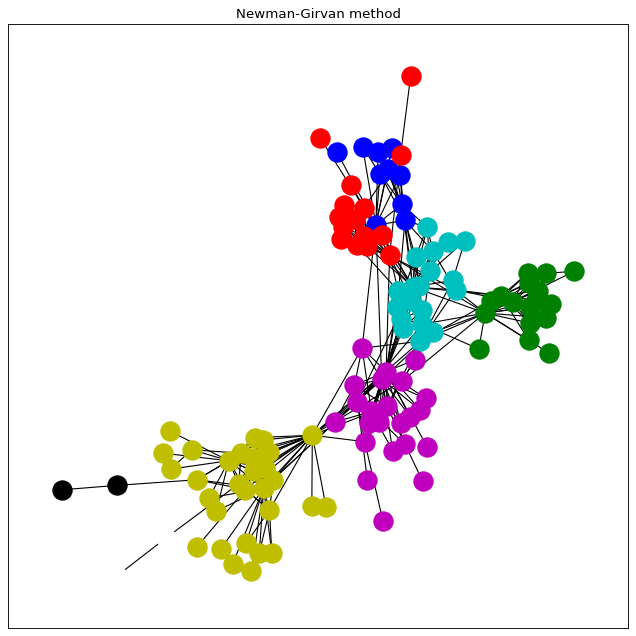

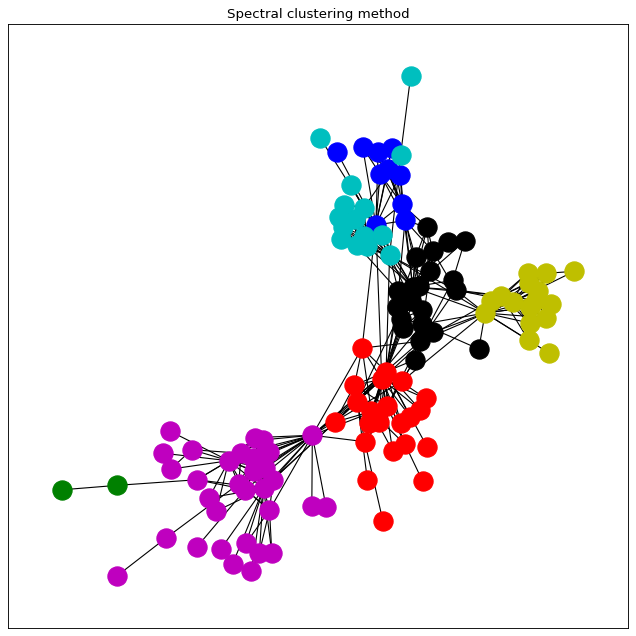

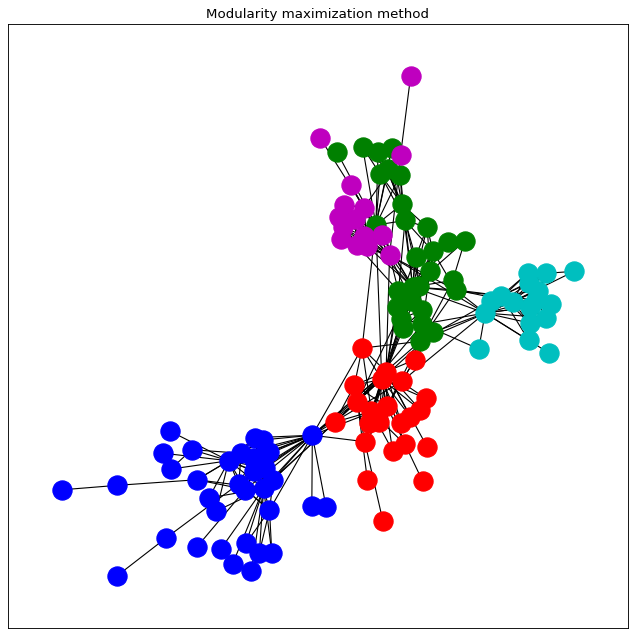

In [25]:
layout_got2 = nx.spring_layout(got2)
vis_comms(got2, 50, True, layout_got2, 300, 10)

#### Based on performance

In [ ]:
vis_comms(got2, 50, False, layout_got2, 3200, 40)

#### Observations

Like the Football network above, Spectral clustering and modularity maximization have similar runtimes. Girvan-Newman method, however, provides us with a faster runtime than before, mainly because of the number of edges (about 400 here).

For modularity score, G-N forms 8 communities, SC forms 7 and MM forms 5. Here, for the performance score, the communities formed differ greatly. The partitions from G-N increase to 50 (our testing upper limit), the ones from SC increase to 25, but MM's remain 5, including the same nodes to the same communities.

Considering both scores, Girvan-Newman outperforms the other two methods wither slightly (0.668), in the case of modularity, or with a considerable difference in the case of performance (0.964).

Again, the above observations would lead someone to choose the **Girvan-Newman method**, which produces the best scores with quite low runtime.

Considering my observations from the first part, the colors for the graphs with a few communities above support my thoughts, connecting it to Random Geometric Graph. The different communities can be separated from one another just by observing the layout of the graph. Also, Girvan-Newman scores the best score for performance forming 50 communities. The reason is that it exploits the cliques made between characters of the show and some exclusive relationships between some of them.

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

### Email-Eu-core

#### Based on modularity

In [ ]:
layout_eu2 = nx.spring_layout(max_eu2)
vis_comms(max_eu2, 50, True, layout_eu2, 1600, 40)

#### Based on performance

In [ ]:
vis_comms(max_eu2, 50, False, layout_eu2, 1600, 40)

#### Ground-truth

In [ ]:
#Ground-truth email-eu-core network

text_file = open("email-Eu-core-department-labels.txt", "r")
lines = text_file.read().split('\n')
partitions = []
comms = []

for row in lines:
    row = row.split(' ')
    if(int(row[0]) in list(max_eu2.nodes)):
        if(int(row[1]) not in partitions):
            partitions.append(int(row[1]))
            comms.append([int(row[0])])
        else:
            inx = partitions.index(int(row[1]))
            comms[inx].append(int(row[0]))

print("Number of partitions in ground-truth email-Eu-core is: "+str(len(partitions)))

modularity = nx.algorithms.community.quality.modularity(max_eu2,comms)
_, performance = nx.algorithms.community.quality.partition_quality(max_eu2,comms)
        
print("Modularity score is: "+str(modularity))
print("Performance score is: "+str(performance))

plt.figure(figsize=(40,40))
nx.draw_networkx_edges(max_eu2, pos=layout_eu2)
for i in range(len(comms)):
    nx.draw_networkx_nodes(max_eu2, pos=layout_eu2, nodelist=comms[i], node_color=colors[i], node_size=1600)        


#### Observations

Checking the runtimes of the 3 methods, Girvan-Newman has an inefficient runtime of 30 minutes, due to the 16000 edges of the graph. Spectral Clustering is faster, finishing in about 1 minute, but modularity maximization is a lot faster, producing results in about 12 seconds. This is expected, considering this is a greedy algorithm.

Again, modularity maximization produces the same communities for the two scores (8). Girvan-Newman creates just 2 communities for modularity score, but 50 for performance score. This deviation is due to the different scores and how they are calculated. Then, spectral clustering leads to 11 communities for modularity score and 28 for performance.

Comparing the scores of each method, G-N is the worst, scoring 0.0006 and 0.14 respectively. Then, SC scores the best for each metric, 0.38 and 0.86 respectively for modularity and performance score. MM is close to SC in terms of modularity (0.347), but considerably less in terms of performance (0.708).

Again, trying to pick one of the above methods, **someone could choose Spectral Clustering with the best scores**,  but here **Modularity Maximization** is also a strong contender, **having significantly less runtime and providing good results**.

Comparing the previous results with the ones of the ground-truth network, it is clear that, in terms of performance, Spectral Clustering is the only one coming a bit closer to the score 0.936. In terms of modularity, both Spectral Clustering and Modularity Maximization provide significantly better scores, while Girvan-Newman has in one instance the closest number of communities (50), but with worse metric scores.

Observing the colourful communities in the above visualizations, especially in the Spectral Clustering method for performance score, they consist of some of the nodes in the center of the graph (many connections, popular nodes) and from many of the nodes they connect with (unpopulars). These communities seem like the ones we would expect to see in a Scale-Free network, as I am going to show below.

#### Οπτικοποίηση κοινοτήτων REG

### Regular 

#### Based on modularity

49it [00:01, 25.56it/s]
  0%|                                                                                           | 0/49 [00:00<?, ?it/s]

Modularity score of Girvan-Newman is: 0.7249999999999999
Number of partitions: 8



100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:21<00:00,  2.31it/s]


Modularity score of Spectral Clustering is: 0.7253125
Number of partitions: 7

Overall time of modularity maximization process: 0.05099821090698242 seconds
Modularity score of Modularity Maximization is: 0.673125
Number of partitions: 4



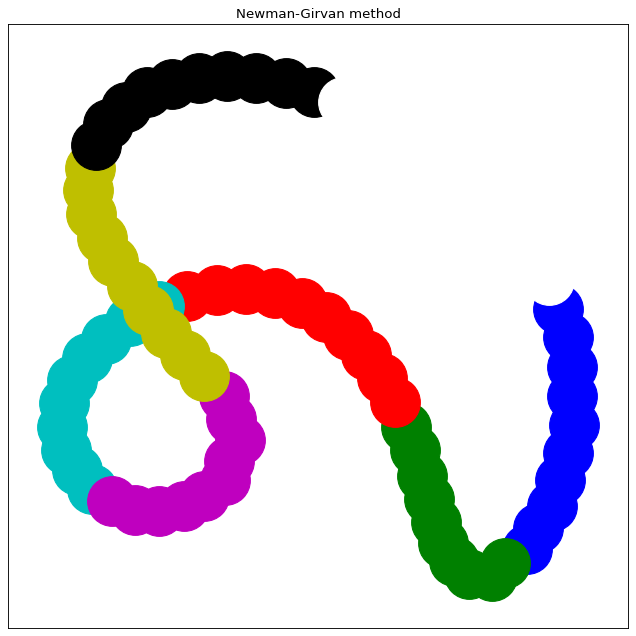

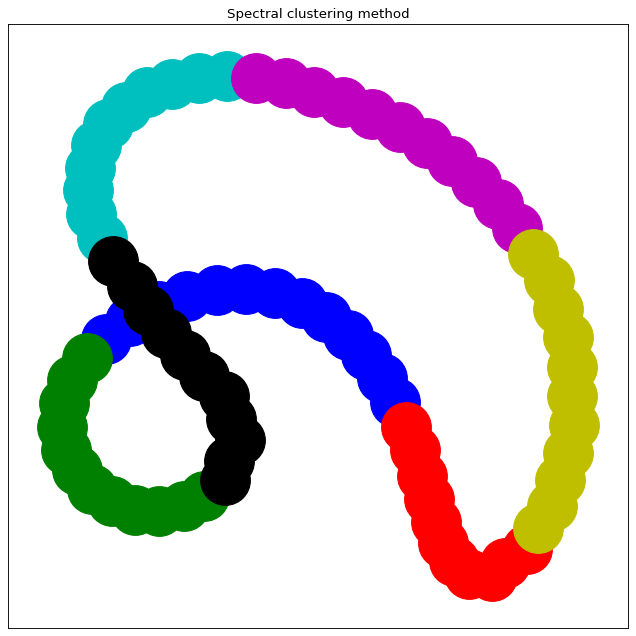

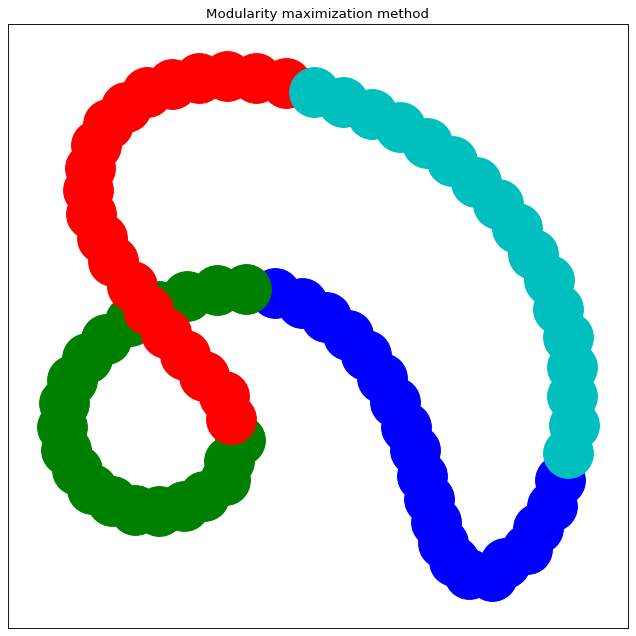

In [122]:
layout_reg = nx.spring_layout(REG)
vis_comms(REG, 50, True, layout_reg, 2000, 10)

#### Based on performance

In [ ]:
vis_comms(REG, 50, False, layout_reg, 2000, 10)

#### Observations

The Regular graph, for every method, is split to communities of continuous nodes. In terms of runtime, Girvan-Newman and Modularity Maximization have the best runtime of 1 second and 0.5 seconds respectively. Spectral Clustering is a lot worse, with 21 seconds.

The number of communities for each score follows the same pattern with the previous networks. The 3 methods have respectively 8, 7 and 4 communities for modularity score and 16, 23 and 4 communities for performance score.

Comparing the scores, for modularity G-N and SC perform similarly (0.725), better than MM (0.673). This is also the case for the performance score with 0.97, 0.975 and 0.8 respectively. It is important to say that the MM performs quite well, considering the low number of communities it forms.

Considering both results and runtime, here **Girvan-Newman** seems like the best choice, with a very low runtime and excellent results.

The high modularity scores can be easily explained by the standard topology of the network. To achieve better performance scores, someone should find the right number of continuous nodes per community, considering the degrees of the nodes and the construction of the network.

#### Οπτικοποίηση κοινοτήτων RGER

### Erdos-Renyi

#### Based on modularity

49it [00:07,  6.21it/s]
  0%|          | 0/49 [00:00<?, ?it/s]

Modularity score of Girvan-Newman is: 0.21109444444444445
Number of partitions: 24



C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  2%|▏         | 1/49 [00:00<00:12,  4.00it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  4%|▍         | 2/49 [00:00<00:09,  4.71it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.htm

Modularity score of Spectral Clustering is: 0.2767944444444445
Number of partitions: 9

Overall time of modularity maximization process: 0.06997823715209961 seconds
Modularity score of Modularity Maximization is: 0.28364999999999996
Number of partitions: 4



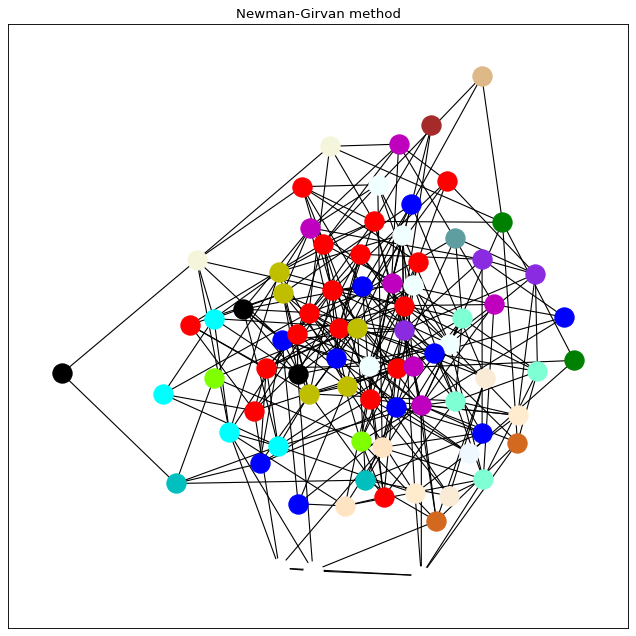

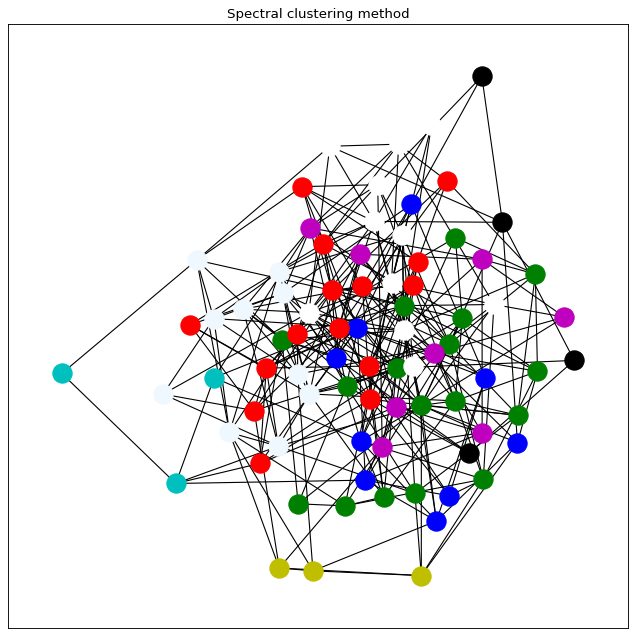

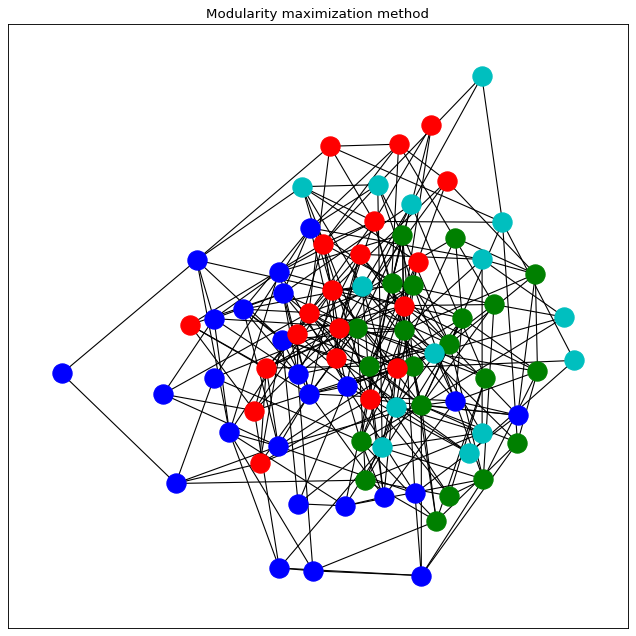

In [26]:
layout_rger = nx.spring_layout(RGER)
vis_comms(RGER, 50, True, layout_rger, 300, 10)

#### Based on performance

In [ ]:
vis_comms(RGER, 50, False, layout_rger, 1000, 20)

#### Observations

The first 2 methods have similar runtimes (about 10 seconds), while modularity maximization is a lot faster, with less than 1 second of runtime.

Again, the number of communities for Girvan-Newman, spectral clustering and modularity maximization is respectively 24, 11, 4 for modularity score and 34, 29, 4 for performance score.

Observing the modularity scores, MM is better with 0.283, followed by SC with 0.268 and G-N with 0.211. On the other hand, the latter two have the best performance scores (0.915-0.92) and MM has the worst, 0.76.

Here, there is no obvious choice for community detection method. It depends on the criteria of the user again, favouring scores over time, or vice versa.

The high number of edges and low number of nodes, as well as the probabilistic way that they are appointed to nodes, seem to make the process of splitting the network to distinct communities hard.

#### Οπτικοποίηση κοινοτήτων RGG

### Random Geometric

#### Based on modularity

49it [00:06,  8.14it/s]
  0%|          | 0/49 [00:00<?, ?it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


Modularity score of Girvan-Newman is: 0.5970493827160495
Number of partitions: 5



  2%|▏         | 1/49 [00:00<00:15,  3.18it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  4%|▍         | 2/49 [00:00<00:09,  5.12it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  6%|▌         | 3/49 [00:00<00:08,  5.70it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/d

Modularity score of Spectral Clustering is: 0.6021827160493827
Number of partitions: 6

Overall time of modularity maximization process: 0.08096075057983398 seconds
Modularity score of Modularity Maximization is: 0.5853728395061728
Number of partitions: 4



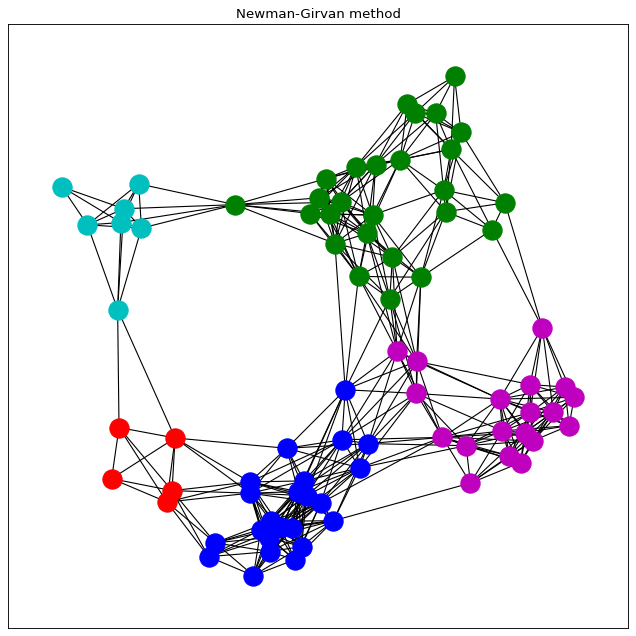

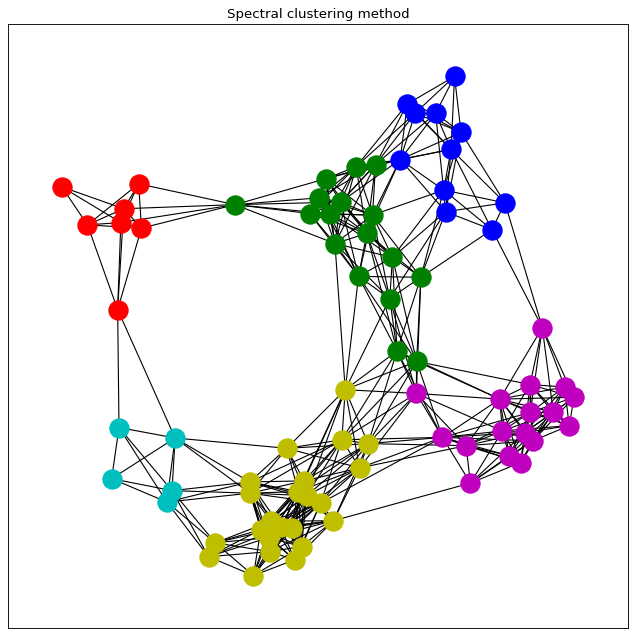

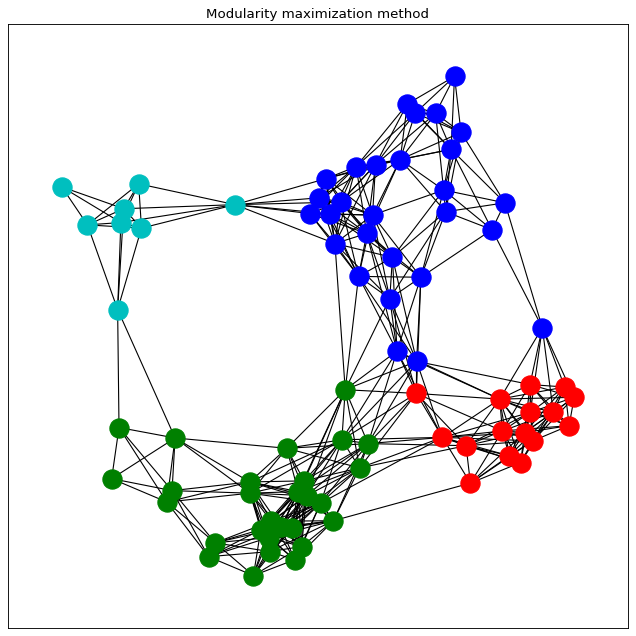

In [27]:
layout_rgg = nx.spring_layout(RGG)
vis_comms(RGG, 50, True, layout_rgg, 300, 10)

#### Based on performance

In [ ]:
vis_comms(RGG, 50, False, layout_rgg, 1000, 20)

#### Observations

Here, modularity maximization has a higher runtime than expected, about 1-2 seconds, while Girvan-Newman runs for 6 seconds and Spectral Clustering runs for 10 seconds.

Counting the number of communities for each of the above visualizations, there are 5, 6 and 4 communities for modularity score for each method respectively, and 22, 10 and 4 communities for performance score.

All the methods have similar modularity scores (0.58-0.6), lower than expected, but the performance scores are 0.93, 0.935 and 0.83 respectively for the 3 methods.

**Girvan-Newman** has the best scores with low runtime, while again MM has the worst performance score, but it makes it up with its very low runtime.

Especially in the visualizations with just a few communities, it is clear that they are formed taking into account the location of the nodes in the geometric layout and the radius around the nodes, where connections happen. For the performance score, where there are more communities, nodes tend to form communities in a closer radius than before.

#### Οπτικοποίηση κοινοτήτων SW

### Small-World

#### Based on modularity

49it [00:02, 21.30it/s]
  0%|          | 0/49 [00:00<?, ?it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


Modularity score of Girvan-Newman is: 0.5741015625
Number of partitions: 8



  4%|▍         | 2/49 [00:00<00:07,  5.88it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  6%|▌         | 3/49 [00:00<00:08,  5.47it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  8%|▊         | 4/49 [00:00<00:08,  5.51it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/d

Modularity score of Spectral Clustering is: 0.56708984375
Number of partitions: 9

Overall time of modularity maximization process: 0.037024736404418945 seconds
Modularity score of Modularity Maximization is: 0.563203125
Number of partitions: 8



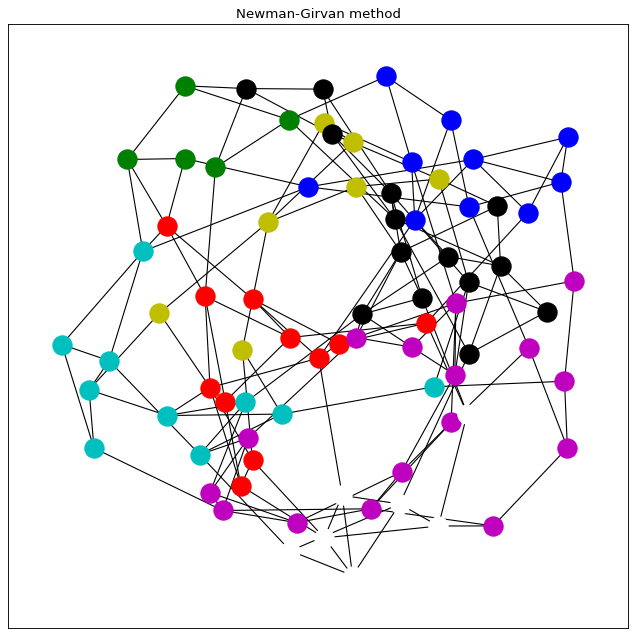

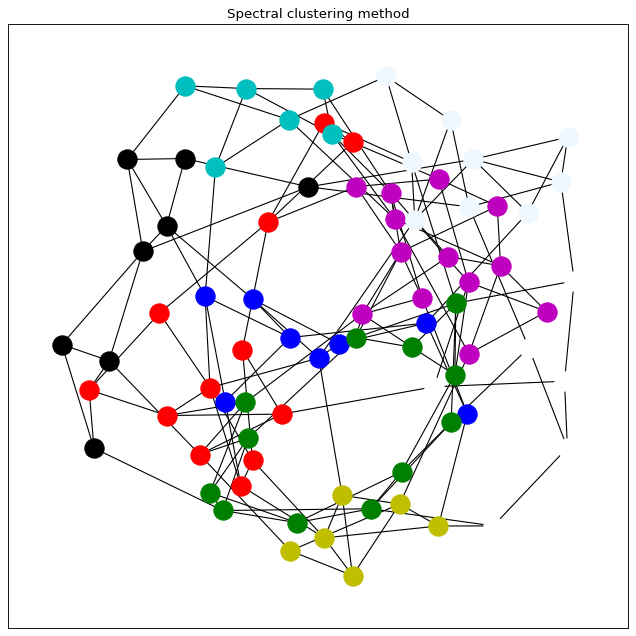

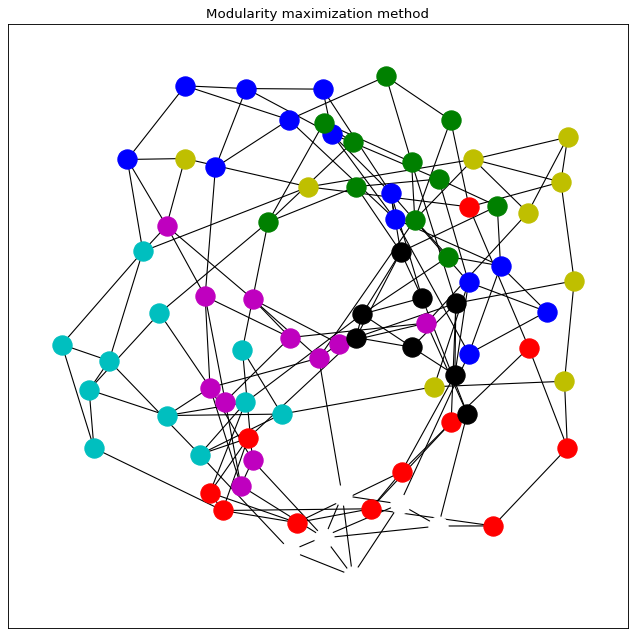

In [28]:
layout_sw = nx.spring_layout(SW)
vis_comms(SW, 50, True, layout_sw, 300, 10)

#### Based on performance

In [ ]:
vis_comms(SW, 50, False, layout_sw, 1000, 20)

#### Observations

Girvan-Newman: Runtime of 2 seconds, modularity score 0.578 with 8 communities and performance score 0.967 with 31 communities.

Spectral Clustering: Runtime of 10 seconds, modularity score 0.56 with 9 communities and performance score 0.967 with 25 communities.

Modularity Maximization: Runtime of 0.04 seconds,  modularity score 0.563 with 8 communities and performance score 0.9 with 8 communities.

Considering the surprising high performance score of MM, as well as the modularity score and the very low runtime, **modularity maximization** is my choice, with runtime as my primary concern. Otherwise, I would choose **Girvan-Newman**.

Here, communities can also be created easily, just by seeing the planar graphs above, especially the ones with just a few communities, for G-N and MM. This is due to the initial state of the Small-World, as a Regular graph. This means that, even after the rewires, a certain pattern of connections among nodes is still visible. This is helpful to the process of community forming.

#### Οπτικοποίηση κοινοτήτων SF

### Scale-Free

#### Based on modularity

49it [00:08,  6.08it/s]


Modularity score of Girvan-Newman is: 0.13638331024930742
Number of partitions: 30



  0%|          | 0/49 [00:00<?, ?it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  2%|▏         | 1/49 [00:00<00:07,  6.41it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(
  4%|▍         | 2/49 [00:00<00:09,  5.10it/s]C:\Python39\lib\site-packages\sklearn\utils\validation.py:585: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stabl

Modularity score of Spectral Clustering is: 0.26802177112188363
Number of partitions: 4

Overall time of modularity maximization process: 0.10900378227233887 seconds
Modularity score of Modularity Maximization is: 0.27000194771468145
Number of partitions: 5



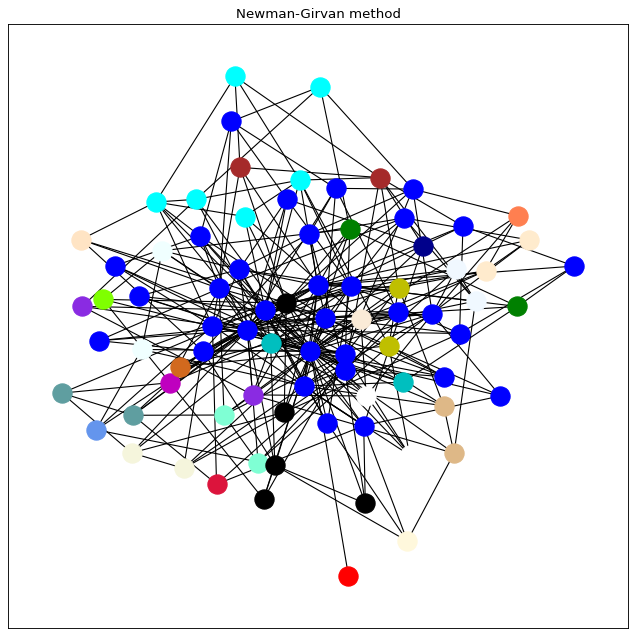

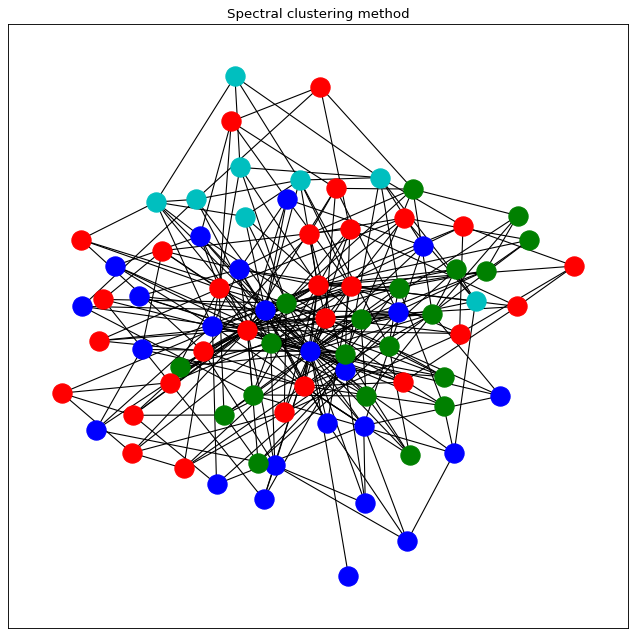

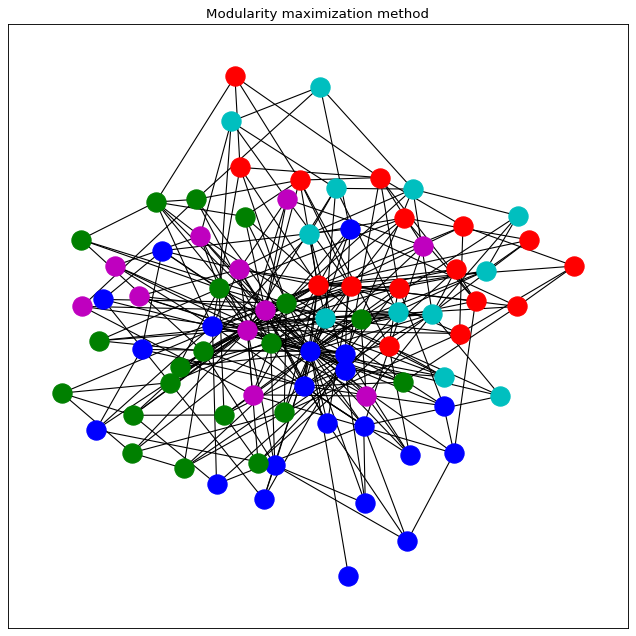

In [29]:
layout_sf = nx.spring_layout(SF)
vis_comms(SF, 50, True, layout_sf, 300, 10)

#### Based on performance

In [ ]:
vis_comms(SF, 50, False, layout_sf, 1000, 20)

#### Observations

Girvan-Newman: Runtime of 9 seconds, modularity score 0.136 with 30 communities and performance score 0.917 with 43 communities.

Spectral Clustering: Runtime of 11 seconds, modularity score 0.268 with 4 communities and performance score 0.914 with 34 communities.

Modularity Maximization: Runtime of 0.08 seconds, modularity score 0.27 with 5 communities and performance score 0.794 with 5 communities.

Here, my choice would be **Spectral Clustering**, which has high modularity and performance scores.

For the Scale-Free network, is is clear that most, if not all, communities have 1 or more nodes near the center of the graph. In these visualizations, the nodes near the center seem to be the ones with higher degree, hence the popular nodes in the scale-free networks. This means that the communities are formed around the popular nodes, with many unpopular nodes they are connected with.

### Conclusions

Considering the methods used, it seems that modularity maximization maintains its communities no matter which is the metric score we use. Although, in most cases its performance score is quite lower than the ones from the other methods. The reason probably is that the algorithm reaches a local maximum before more communities can be formed, increasing the performance score.

The Girvan-Newman and Spectral Clustering methods tend to create more but smaller communities when trying to maximize performance score. The Girvan-Newman method's runtime is heavily depended on the number of edges in the graph, while spectral clustering is more independent.